# **Instance Segmentation with YOLO11 Using the USIS10K Dataset**

In this notebook, I fine-tune the [YOLO11-seg](https://docs.ultralytics.com/tasks/segment/) model from [Ultralytics], the most recent and advanced model in the YOLO series for real-time instance segmentation. The YOLO11-seg models have been pre-trained on the [COCO](https://docs.ultralytics.com/datasets/detect/coco/#coco-pretrained-models) dataset, which consists of 200,000 images and 80 object categories, providing a solid foundation for general instance segmentation tasks.

In this case, I specifically fine-tune the `YOLO11l-seg` model using the [Underwater Salient Instance Segmentation Dataset (USIS10K)](https://github.com/liamlian0727/usis10k), which contains 10,632 underwater images with pixel-level annotations across seven categories of various underwater scenes. This large-scale dataset, designed for underwater salient instance segmentation, is divided into 70% (7,442 images) for training, 15% (1,594 images) for validation, and 15% (1,596 images) for testing. Table 5 from the [official paper](https://raw.githubusercontent.com/mlresearch/v235/main/assets/lian24c/lian24c.pdf) lists all the category labels of the USIS10K dataset along with their detailed definitions:

| Category       | Description                                                                                |
|----------------|--------------------------------------------------------------------------------------------|
| Fish           | Underwater vertebrates, e.g., fish, turtles                                                |
| Reefs          | Underwater invertebrates and coral reefs                                                   |
| Aquatic plants | Aquatic plants and flora                                                                   |
| Wrecks/ruins   | Wrecks, ruins and damaged artifacts                                                        |
| Human divers   | Human divers and their equipment                                                           |
| Robots         | Underwater robots like AUV (Autonomous Underwater Vehicle), ROV (Remotely Operated Vehicle)|
| Sea-floor      | Rocks and reefs on the seafloor                                                            |

## **Imports**

In [1]:
# Installation of the Ultralytics library
!pip install ultralytics -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 949.3/949.3 kB 25.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 36.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 56.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 32.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 64.2 MB/s eta 0:00:00


In [2]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
from PIL import Image
from google.colab import drive
from glob import glob
from IPython.display import clear_output, display, Video
import cv2
import yaml
import os

# Necessary in Colab with Ultralytics to prevent path-related encoding errors
import locale
locale.getpreferredencoding = lambda: "UTF-8"

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [31]:
# Mount Google Drive in Colab
drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive


## **Parameters**

In [4]:
model_name = "yolo11l-seg.pt"
zip_dataset_path = "/content/drive/MyDrive/Datasets/USIS10K.zip"
dataset_dir = os.path.basename(zip_dataset_path).split(".")[0]
project_dir = "/content/drive/MyDrive/Ultralytics"
project_name = os.path.join(project_dir, "InstanceSegmentation_YOLO11l_USIS10K")
batch_size = 16
epochs = 25
patience = 7
imgsz = 640

## **Load the Dataset**

The download, along with all the preprocessing and analysis of the USIS10K, has been completed in the following notebook: [Preprocessing_USIS10K](https://github.com/JersonGB22/ImageSegmentation-TensorFlow-PyTorch/blob/main/Preprocessing/Preprocessing_USIS10K.ipynb).

In [ ]:
!unzip -q $zip_dataset_path

## **Training and Evaluation of the Model**

The **YOLO11l-seg** model, downloaded from Ultralytics' GitHub repository, is based on **PyTorch**, which prevents it from being trained on **Google Colab's TPU** to speed up the process.  

One of the main advantages of **Ultralytics** is that there is no need to manually specify the optimizer or learning rate, as these parameters are automatically adjusted based on the dataset size and the number of epochs. However, in this case, the best results were obtained experimentally by using an **initial learning rate** of `8.8e-5` and a **final learning rate** of `8.8e-7`. With this configuration, the model converged in just **25 epochs**, achieving optimal performance in the shortest possible time. Experiments were conducted with a higher number of epochs, but the model did not show any improvement in generalization on the validation set and, in some cases, even performed worse.  

Finally, since training YOLO models can be time-consuming, Ultralytics provides options to resume training from where it was left off. This is particularly useful in case of interruptions or if the free GPU time on Colab is exceeded, which has a maximum limit of 4 hours and 10 minutes. However, in this case, it will not be necessary, as fine-tuning the model takes approximately **3 hours and 25 minutes**.

Regarding data augmentation to make the model more robust and prevent overfitting, with Ultralytics, it is simply a matter of adjusting the values of each transformation since everything is implemented with the [Albumentations](https://albumentations.ai/), [OpenCV](https://opencv.org/) and [Torchvision](https://pytorch.org/vision/stable/index.html) libraries.

During training, the **YOLO-seg** model uses the following four loss functions::

- **box_loss**: This is the **Complete Intersection over Union (CIoU) Loss**. This loss function considers not only the overlap between the predicted and actual bounding boxes but also the distance between their centers and the aspect ratio. This makes it a more thorough metric for assessing box alignment. It surpasses the performance of IoU (Intersection over Union), GIoU (Generalized IoU), and DIoU (Distance IoU) losses.

- **seg_loss**: This loss function evaluates the accuracy of instance segmentation. The predicted masks are obtained by combining mask coefficients with prototypes, while the ground truth masks are generated from the coordinates of the contours or polygons of the instances, which are then converted into binary masks. The comparison is performed by applying **Binary Cross-Entropy with Logits** on a pixel-by-pixel basis to the masks cropped according to each instance’s bounding box, with the loss normalized by dividing by the corresponding area. This formulation ensures a precise measurement of segmentation errors in delineating object boundaries and separating overlapping instances, preventing errors on small objects from having an excessive impact.

- **cls_loss**: This is the **Binary Cross-Entropy loss with logits** applied to the model's classifier.

- **dfl_loss**: This refers to the **Distribution Focal Loss (DFL)**, an enhanced variant of the focal loss aimed at giving greater emphasis to difficult-to-classify instances. It modifies the focal loss according to the class distribution, enhancing the model's sensitivity to minority classes and helping to address class imbalance.

In [ ]:
pretrained = False
if pretrained:
  model = YOLO(os.path.join(project_name, "weights/last.pt"))
else:
  model = YOLO(model_name)

model.info()

100%|██████████| 53.5M/53.5M [00:01<00:00, 38.6MB/s]


YOLO11l-seg summary: 379 layers, 27,678,368 parameters, 0 gradients, 143.0 GFLOPs


(379, 27678368, 0, 143.004928)

In [ ]:
if pretrained:
  results = model.train(resume=True)

else:
  results = model.train(
      data=os.path.join(dataset_dir, "val_data.yaml"),
      epochs=epochs,
      patience=patience,
      batch=batch_size,
      optimizer="AdamW",
      lr0=8.8e-5,
      lrf=1e-2, #final_learning_rate = lr0 * lrf
      momentum=0.9,
      imgsz=imgsz,
      deterministic=True, #Allows for reproducibility of the training
      verbose=True, #Enables model evaluation on the validation dataset immediately after training
      project=project_dir,
      name=project_name,

      # Data Augmentation
      hsv_h=0.015, #Randomly adjusts the hue of the image within the range [1-0.015; 1+0.015]
      hsv_s=0.2, #Randomly adjusts the saturation of the image within the range [1-0.2; 1+0.2]
      hsv_v=0.3, #Randomly adjusts the brightness of the image within the range [1-0.3; 1+0.3]
      translate=0.1, #Randomly shifts the image horizontally and vertically by up to 10% of its original size
      scale=0.25, #Randomly scales the image size within the range of [100%-25%; 100%+25%]
      fliplr=0.5, #Horizontal flip of the image with a probability of 0.5
      mosaic=1.0, #Combines 4 images into one with a probability of 1
      close_mosaic=0, #Allows applying the mosaic in all epochs
      erasing=0.25 #25% probability of applying random erasure using 'torchvision.transforms.RandomErasing'
  )

Ultralytics 8.3.91 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=segment, mode=train, model=yolo11l-seg.pt, data=USIS10K/val_data.yaml, epochs=25, time=None, patience=7, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/drive/MyDrive/Ultralytics, name=InstanceSegmentation_YOLO11l_USIS10K, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=0, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, sa

100%|██████████| 755k/755k [00:00<00:00, 97.2MB/s]


Overriding model.yaml nc=80 with nc=7

                   from  n    params  module                                       arguments                     
  0                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  1                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  2                  -1  2    173824  ultralytics.nn.modules.block.C3k2            [128, 256, 2, True, 0.25]     
  3                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              
  4                  -1  2    691712  ultralytics.nn.modules.block.C3k2            [256, 512, 2, True, 0.25]     
  5                  -1  1   2360320  ultralytics.nn.modules.conv.Conv             [512, 512, 3, 2]              
  6                  -1  2   2234368  ultralytics.nn.modules.block.C3k2            [512, 512, 2, True]           
  7                  -1  1   2360320  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 299MB/s]


AMP: checks passed ✅


train: Scanning /content/USIS10K/train/labels... 7442 images, 0 backgrounds, 0 corrupt: 100%|██████████| 7442/7442 [00:07<00:00, 985.91it/s] 


train: New cache created: /content/USIS10K/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/USIS10K/val/labels... 1594 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1594/1594 [00:02<00:00, 690.00it/s] 

val: New cache created: /content/USIS10K/val/labels.cache


Plotting labels to /content/drive/MyDrive/Ultralytics/InstanceSegmentation_YOLO11l_USIS10K/labels.jpg... 
optimizer: AdamW(lr=8.8e-05, momentum=0.9) with parameter groups 176 weight(decay=0.0), 187 weight(decay=0.0005), 186 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/drive/MyDrive/Ultralytics/InstanceSegmentation_YOLO11l_USIS10K
Starting training for 25 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/25      11.9G     0.8484      1.895      1.677      1.244         11        640: 100%|██████████| 466/466 [07:40<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 50/50 [00:32<00:00,  1.54it/s]


                   all       1594       2788      0.363        0.4      0.377      0.287      0.312      0.292      0.254      0.138

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/25      12.3G     0.8022      1.708      1.378       1.21         10        640: 100%|██████████| 466/466 [07:38<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 50/50 [00:33<00:00,  1.51it/s]

                   all       1594       2788      0.481      0.452      0.445      0.347       0.46      0.428      0.402      0.227



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/25      12.4G     0.7843      1.617       1.29      1.195          7        640: 100%|██████████| 466/466 [07:33<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 50/50 [00:32<00:00,  1.53it/s]

                   all       1594       2788      0.471      0.499      0.453      0.358      0.473      0.505      0.451      0.321



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/25      12.6G     0.7579      1.573      1.228      1.176          2        640: 100%|██████████| 466/466 [07:31<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 50/50 [00:33<00:00,  1.50it/s]

                   all       1594       2788      0.465      0.478      0.463      0.359      0.463      0.474      0.458      0.328



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/25      12.7G     0.7372      1.503      1.166      1.163         10        640: 100%|██████████| 466/466 [07:33<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 50/50 [00:32<00:00,  1.54it/s]

                   all       1594       2788      0.489      0.489        0.5      0.398      0.485      0.486      0.494      0.356



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/25      12.8G       0.72      1.447      1.123      1.153          4        640: 100%|██████████| 466/466 [07:32<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 50/50 [00:32<00:00,  1.56it/s]

                   all       1594       2788       0.59      0.498      0.541      0.429       0.55      0.536      0.545      0.398



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/25      12.9G     0.7023      1.418      1.063      1.138          6        640: 100%|██████████| 466/466 [07:31<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 50/50 [00:32<00:00,  1.54it/s]

                   all       1594       2788      0.558      0.552      0.551      0.441       0.56      0.553      0.547      0.402



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/25        13G      0.684      1.382      1.021      1.128          7        640: 100%|██████████| 466/466 [07:30<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 50/50 [00:32<00:00,  1.54it/s]

                   all       1594       2788       0.56      0.525      0.574      0.463      0.561      0.523      0.567      0.416



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/25      13.1G     0.6768      1.362     0.9906      1.118          5        640: 100%|██████████| 466/466 [07:31<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 50/50 [00:32<00:00,  1.54it/s]

                   all       1594       2788      0.599      0.565      0.595      0.483      0.681      0.529      0.592      0.437



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/25      13.2G     0.6543      1.311     0.9607      1.105          6        640: 100%|██████████| 466/466 [07:31<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 50/50 [00:31<00:00,  1.56it/s]

                   all       1594       2788      0.629       0.51      0.567      0.459      0.629      0.511      0.564       0.42



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      11/25      13.3G     0.6464      1.272     0.9361      1.093          7        640: 100%|██████████| 466/466 [07:30<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 50/50 [00:32<00:00,  1.55it/s]

                   all       1594       2788      0.643      0.551      0.598      0.487      0.643      0.543      0.592      0.443



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      12/25      13.4G     0.6338      1.274     0.9041       1.09          6        640: 100%|██████████| 466/466 [07:31<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 50/50 [00:32<00:00,  1.56it/s]

                   all       1594       2788      0.573      0.599      0.589      0.479      0.571      0.596      0.582      0.433



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      13/25      12.2G     0.6323      1.251      0.882       1.09          9        640: 100%|██████████| 466/466 [07:31<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 50/50 [00:32<00:00,  1.55it/s]

                   all       1594       2788      0.596      0.588      0.612      0.507      0.594      0.586       0.61       0.46



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      14/25        12G     0.6194      1.238     0.8614      1.076          7        640: 100%|██████████| 466/466 [07:32<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 50/50 [00:32<00:00,  1.55it/s]

                   all       1594       2788      0.616      0.557      0.602      0.493      0.618      0.562      0.602      0.453



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      15/25      12.1G       0.61      1.206     0.8336      1.075          3        640: 100%|██████████| 466/466 [07:30<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 50/50 [00:31<00:00,  1.57it/s]

                   all       1594       2788      0.674       0.58      0.625       0.51      0.674       0.58      0.625       0.47



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      16/25      12.3G     0.5953      1.181      0.812      1.059          3        640: 100%|██████████| 466/466 [07:31<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 50/50 [00:32<00:00,  1.53it/s]

                   all       1594       2788      0.627      0.607      0.618      0.515      0.625      0.606      0.616      0.467



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      17/25      12.4G     0.5851      1.146     0.7747      1.051          3        640: 100%|██████████| 466/466 [07:33<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 50/50 [00:32<00:00,  1.53it/s]

                   all       1594       2788      0.624      0.618      0.627      0.518      0.626       0.62      0.629      0.474



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      18/25      12.5G     0.5786       1.14     0.7588      1.045          9        640: 100%|██████████| 466/466 [07:31<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 50/50 [00:32<00:00,  1.55it/s]

                   all       1594       2788      0.631      0.605       0.62      0.514      0.631        0.6      0.618      0.472



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      19/25      12.6G     0.5715      1.116     0.7318      1.043          6        640: 100%|██████████| 466/466 [07:32<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 50/50 [00:32<00:00,  1.54it/s]

                   all       1594       2788      0.579      0.635      0.631      0.519      0.586      0.632       0.63      0.478



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      20/25      12.7G     0.5631      1.108     0.7168      1.033          7        640: 100%|██████████| 466/466 [07:31<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 50/50 [00:32<00:00,  1.54it/s]

                   all       1594       2788      0.625      0.607      0.635      0.527      0.624      0.614      0.637      0.488



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      21/25      12.8G     0.5516      1.075     0.6917      1.025          7        640: 100%|██████████| 466/466 [07:31<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 50/50 [00:32<00:00,  1.56it/s]

                   all       1594       2788       0.68      0.579      0.626       0.52      0.675      0.582      0.625      0.476



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      22/25      12.9G     0.5392      1.066     0.6629      1.018          5        640: 100%|██████████| 466/466 [07:34<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 50/50 [00:32<00:00,  1.56it/s]

                   all       1594       2788      0.625      0.633      0.638      0.533      0.621      0.632      0.635      0.486



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      23/25        13G     0.5442      1.056     0.6503      1.021          7        640: 100%|██████████| 466/466 [07:33<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 50/50 [00:32<00:00,  1.53it/s]

                   all       1594       2788      0.688      0.586      0.634      0.533      0.686      0.585      0.631      0.486



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      24/25      13.1G     0.5282       1.04     0.6231      1.009          8        640: 100%|██████████| 466/466 [07:31<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 50/50 [00:32<00:00,  1.55it/s]

                   all       1594       2788      0.671      0.596      0.639      0.532      0.672      0.596      0.638      0.488



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      25/25      13.2G     0.5293      1.034     0.6278      1.012          9        640: 100%|██████████| 466/466 [07:31<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 50/50 [00:32<00:00,  1.55it/s]

                   all       1594       2788       0.66      0.601      0.638      0.537      0.659        0.6      0.634       0.49



25 epochs completed in 3.390 hours.
Optimizer stripped from /content/drive/MyDrive/Ultralytics/InstanceSegmentation_YOLO11l_USIS10K/weights/last.pt, 55.8MB
Optimizer stripped from /content/drive/MyDrive/Ultralytics/InstanceSegmentation_YOLO11l_USIS10K/weights/best.pt, 55.8MB

Validating /content/drive/MyDrive/Ultralytics/InstanceSegmentation_YOLO11l_USIS10K/weights/best.pt...
Ultralytics 8.3.91 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11l-seg summary (fused): 203 layers, 27,589,989 parameters, 0 gradients, 141.9 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 50/50 [00:34<00:00,  1.46it/s]


                   all       1594       2788      0.661      0.598      0.638      0.536      0.661      0.597      0.634       0.49
        aquatic plants         57         73      0.302      0.274      0.227      0.173      0.302      0.274      0.225      0.153
                  fish        942       1357      0.879      0.827      0.917      0.791      0.879      0.827      0.917      0.749
          human divers        145        205      0.902      0.855      0.901      0.772      0.912      0.864      0.908       0.67
                 reefs        493        854       0.64       0.52      0.592      0.476      0.646      0.525      0.595      0.431
                robots         45         47      0.683      0.745      0.713      0.598      0.664      0.723      0.679      0.551
             sea-floor         58         79      0.503      0.241      0.337      0.283      0.503      0.241      0.337      0.263
          wrecks/ruins        136        173      0.719      0.727   

Upon completing the training, Ultralytics automatically evaluates the model's performance on the validation dataset, generating performance metrics and their corresponding graphs. The metrics for instance segmentation are as follows:

- **Precision:** This metric measures the proportion of correct predictions among all predictions made by the model. It is calculated as the number of true positives (TP) divided by the sum of true positives and false positives (FP).

  - **True Positives (TP):** A true positive is counted when the predicted bounding box or segmentation mask has an Intersection over Union (IoU) of at least 0.5 with the ground truth box or mask and belongs to the same class. This means the model has not only correctly detected the presence of an object but has also accurately identified its location, contour, and category.
  
  - **False Positives (FP):** A false positive occurs when the model predicts the presence of an object (i.e., generates a bounding box or segmentation mask), but no corresponding object actually exists in the image, or the detected or segmented object does not belong to the correct class.

  - **False Negatives (FN):** A false negative occurs when the model fails to detect an object that is present in the image. In other words, a real object exists, but the model does not generate any corresponding prediction for it.

- **Recall:** This metric measures the proportion of correctly detected or segmented objects relative to the total number of objects actually present in the image. It is calculated by dividing the number of true positives by the sum of true positives and false negatives.

- **mAP50:** The mean Average Precision at an IoU threshold of 0.5, where Average Precision (AP) is calculated as the area under the precision-recall curve. This metric offers an overall evaluation of the model's ability to detect or segment objects accurately, by averaging precision across various classes, with the IoU threshold fixed at 0.5. It is a standard metric used in the evaluation of the COCO dataset.

- **mAP50-95:** The mean Average Precision across multiple IoU thresholds ranging from 0.5 to 0.95, incremented by 0.05. This metric provides a more comprehensive evaluation of the model's performance, accounting for varying levels of object localization or segmentation precision. Like mAP50, this metric is also used in COCO evaluations, enabling standardized comparisons across different models.

All these metrics range from **0** to **1**, where a value of **0** signifies poor performance (no correct predictions), and a value of **1** represents perfect performance (all predictions are correct).

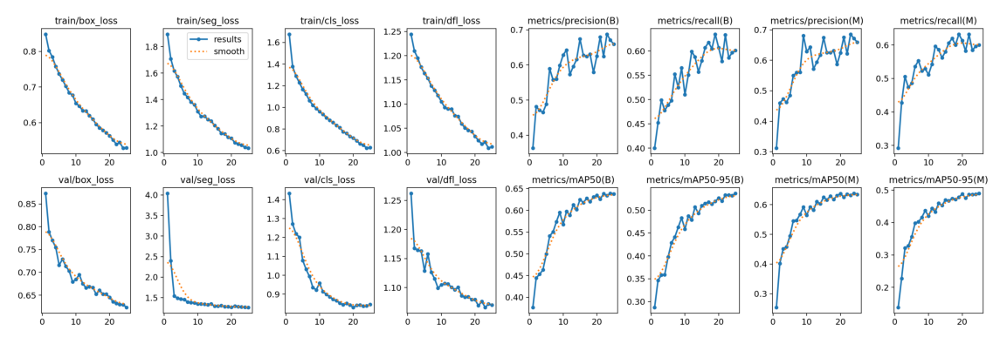

In [ ]:
# Loss and Metrics Graphs
plt.figure(figsize=(12, 8))

img = Image.open(os.path.join(project_name, "results.png"))
plt.imshow(img)
plt.tight_layout()
plt.axis("off");

In [ ]:
# Model evaluation on the test dataset
test_results = model.val(
    data=os.path.join(dataset_dir, "test_data.yaml"),
    name=os.path.join(project_name, "test_eval"),
    batch=batch_size,
    imgsz=imgsz,
    save=True,
    verbose=True,
    exist_ok=True
)

Ultralytics 8.3.91 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)


val: Scanning /content/USIS10K/test/labels... 1596 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1596/1596 [00:04<00:00, 332.22it/s]


val: New cache created: /content/USIS10K/test/labels.cache


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 100/100 [01:01<00:00,  1.63it/s]


                   all       1596       2873      0.685      0.588      0.641      0.543       0.68      0.582      0.635      0.495
        aquatic plants         52         74      0.333      0.311      0.245      0.195      0.318      0.296      0.236      0.158
                  fish        998       1571      0.896      0.811      0.915      0.784      0.897      0.809      0.917      0.747
          human divers        158        196        0.9      0.878      0.934      0.836       0.89      0.867      0.926       0.73
                 reefs        450        763      0.649      0.509      0.584      0.476      0.641      0.501      0.569      0.421
                robots         45         48      0.751      0.583      0.678      0.575      0.752      0.583      0.678      0.526
             sea-floor         50         68      0.497      0.324       0.35      0.279      0.498      0.324      0.352      0.271
          wrecks/ruins        127        153      0.771      0.702   

## **Inference with the Trained Model**

Inference with a fine-tuned Ultralytics YOLO model is straightforward, as it accepts a wide range of image and video formats for predictions. Additionally, the results are presented graphically and can be obtained in real time. All accepted formats are detailed in the official [Ultralytics documentation](https://docs.ultralytics.com/modes/predict/#inference-sources).

In [5]:
# Load the trained model
model = YOLO(os.path.join(project_name, "weights/best.pt"))

In [ ]:
# Function for image inference
def instance_segmentation(images, n_rows=2, n_cols=2, random=True, font_size=20, save=False, path_save=""):
  n_samples = int(n_rows * n_cols)
  sample_images = np.random.choice(images, n_samples, replace=False).tolist() if random else images[:n_samples]

  results = model.predict(
      source=sample_images,
      imgsz=imgsz,
      batch=batch_size,
      save=False,
      verbose=False
  )

  fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 4.8, n_rows * 4.8))
  axes = axes.flatten() if n_samples > 1 else [axes]

  for i, result in enumerate(results):
    result = result.plot(line_width=2, font_size=font_size, pil=True)
    result = np.array(result)[..., ::-1] #Convert the image to RGB format
    axes[i].imshow(result)
    axes[i].axis("off")

  plt.tight_layout()
  # Save images
  if save:
    plt.savefig(path_save)

  plt.show()

### **Validation Dataset**

In [ ]:
val_image_paths = glob(os.path.join(dataset_dir, "val/images/*.jpg"))

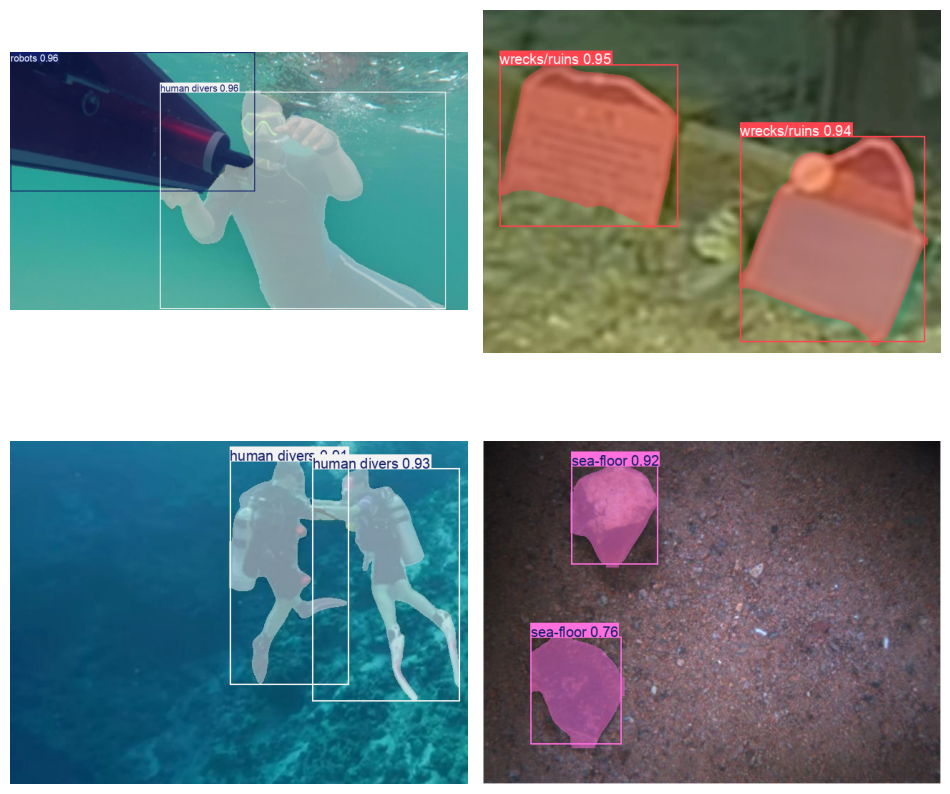

In [ ]:
instance_segmentation(val_image_paths)

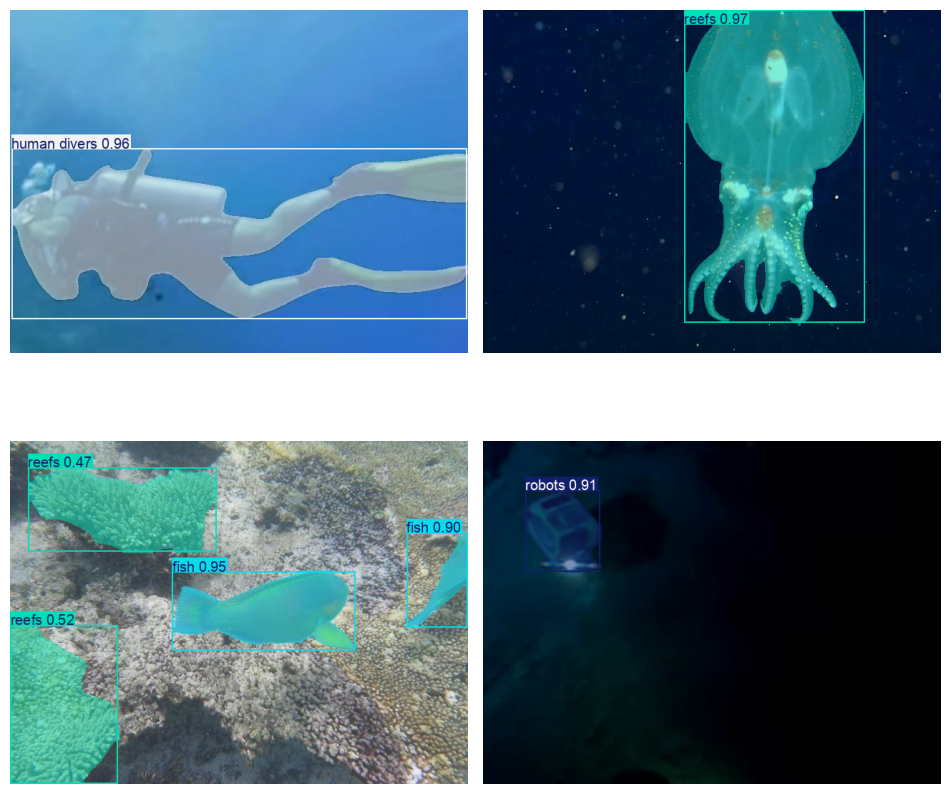

In [ ]:
instance_segmentation(val_image_paths)

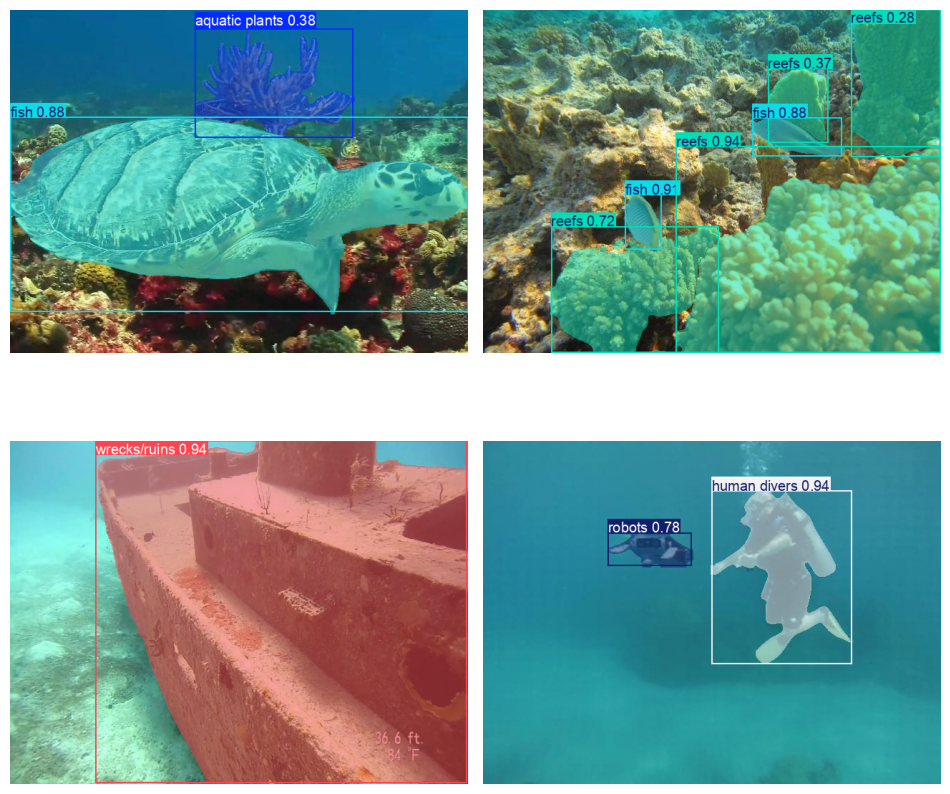

In [ ]:
instance_segmentation(
    val_image_paths, save=True,
    path_save="InstanceSegmentation_YOLO11l_USIS10K_1.png"
)

### **Test Dataset**

In [ ]:
test_image_paths = glob(os.path.join(dataset_dir, "test/images/*.jpg"))

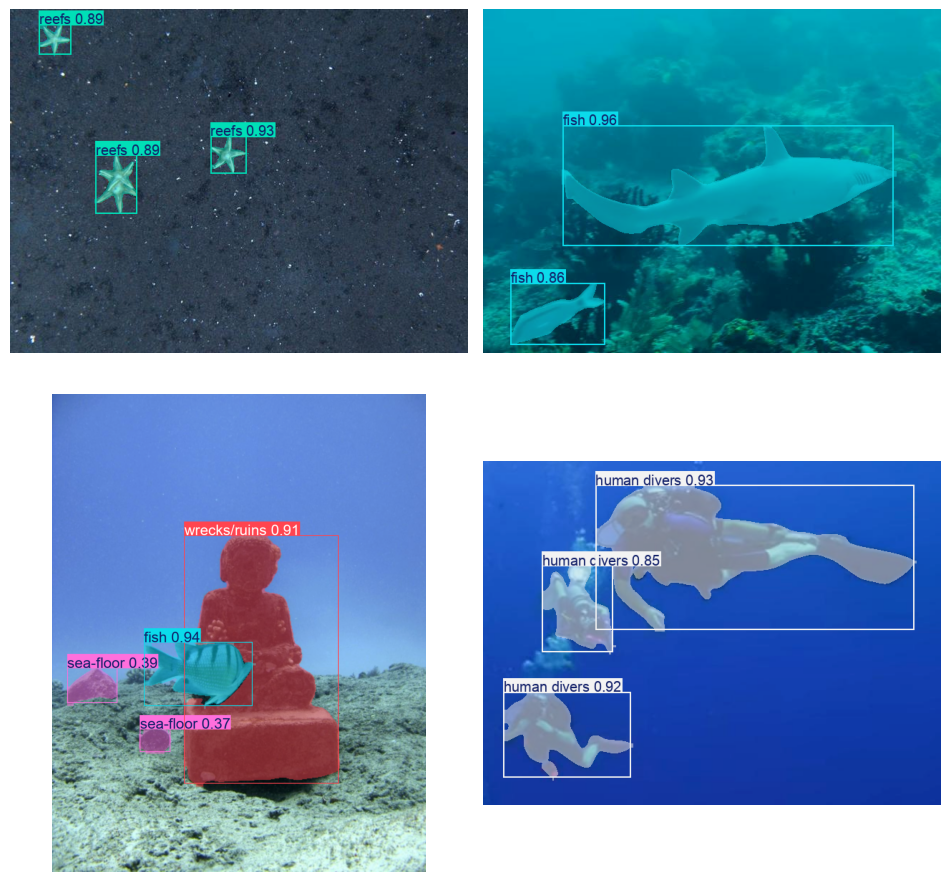

In [ ]:
instance_segmentation(
    test_image_paths, font_size=None, save=True,
    path_save="InstanceSegmentation_YOLO11l_USIS10K_2.png"
)

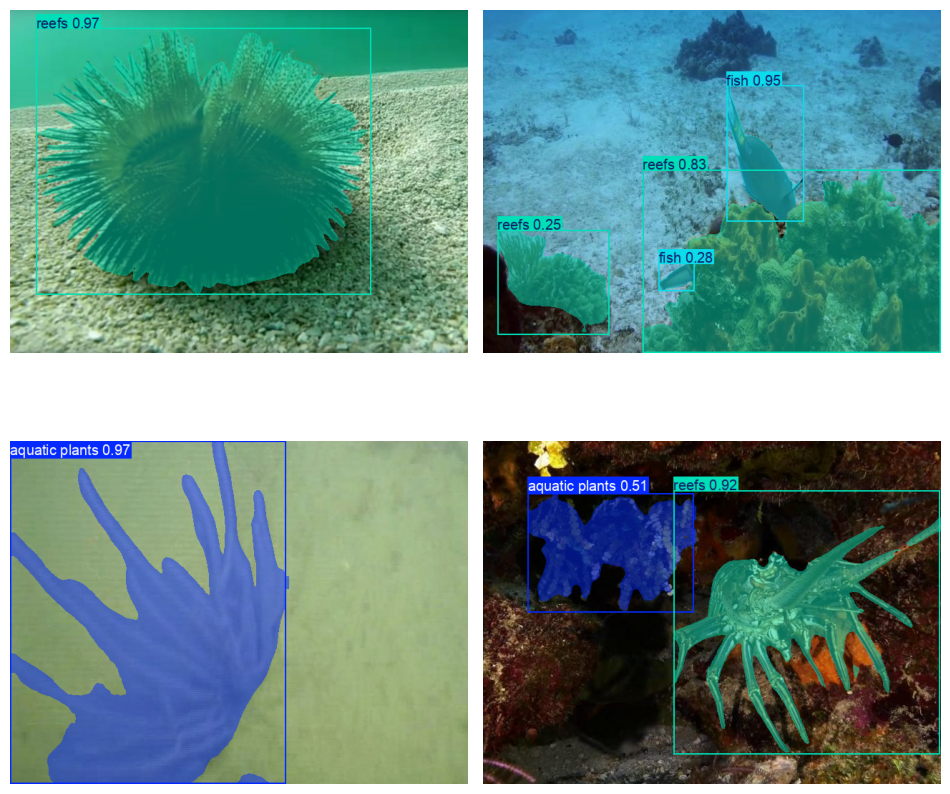

In [ ]:
instance_segmentation(test_image_paths, font_size=None)

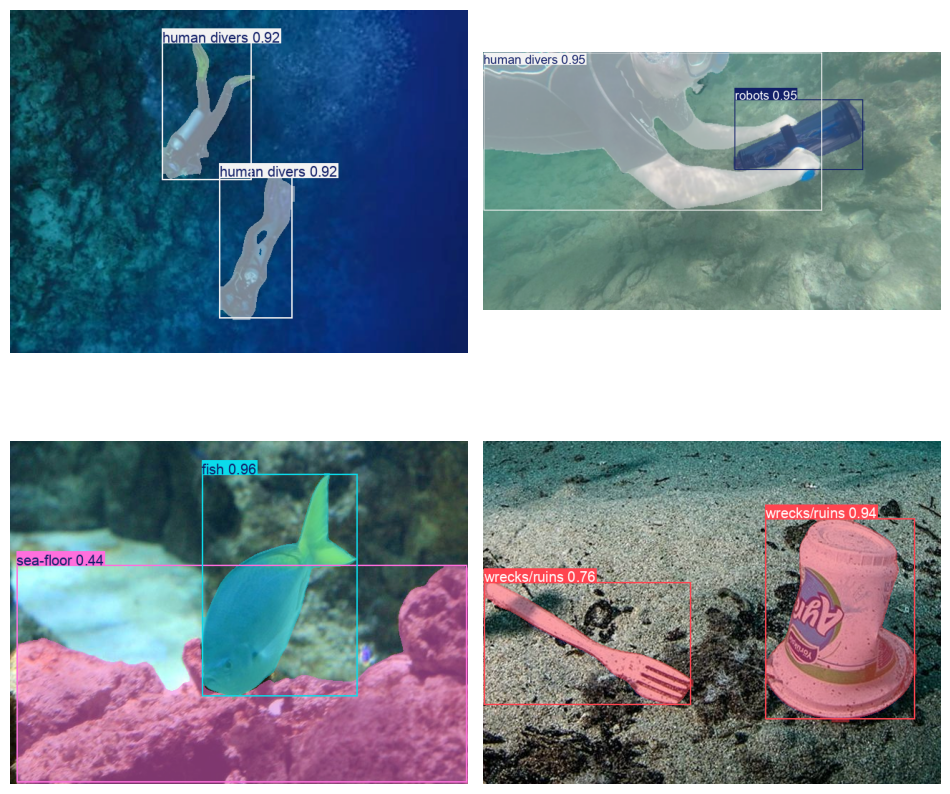

In [ ]:
instance_segmentation(test_image_paths, font_size=None)

### **Internet Images**

In [ ]:
list_urls = [
    "https://www.dresseldivers.com/wp-content/uploads/Palancar-Reef-Arrecife-Palancar-3.jpg",
    "https://elsouvenir.com/wp-content/uploads/2022/10/Snorkeleando-en-las-profundidades-Foto-shutterstock1-1.jpg",
    "https://bluerobotics.com/wp-content/uploads/2019/09/ibubble-selfie-1024x479.jpg",
    "https://scontent.flim6-3.fna.fbcdn.net/v/t1.6435-9/156574568_3914315911938762_2300314960875596894_n.png?_nc_cat=106&ccb=1-7&_nc_sid=127cfc&_nc_ohc=9fMKXdHwR3MQ7kNvgFuxkFb&_nc_oc=AdlcXBfbeV-GjxoECF-PPTI7Ldf9i6MIoAqTapd7sQBTnNEIx3d43tEBHSL9kcCl0qs&_nc_zt=23&_nc_ht=scontent.flim6-3.fna&_nc_gid=ZlAPzQC2MiuwNcFwWcLRFg&oh=00_AYGLJaqnLxMJ0ngfc2H3ZTETSzvAAJO52ItbEK65JqU5tA&oe=6801511C",

    "https://dynamic-media-cdn.tripadvisor.com/media/photo-o/0d/b3/8a/ba/diving.jpg?w=700&h=-1&s=1",
    "https://www.dresseldivers.com/wp-content/uploads/Palancar-Reef-main-picture-900x480.jpg",
    "https://scontent.flim6-4.fna.fbcdn.net/v/t39.30808-6/484526646_23877128815221215_4667183292233883960_n.jpg?_nc_cat=105&ccb=1-7&_nc_sid=127cfc&_nc_ohc=-QR_VmEppXQQ7kNvgFT4wzO&_nc_oc=AdlRrKsw8A-8Xu966iDDkiciTMPtlGgIc3ihoddiY9obsUidWZxHXMo1fCX9ayBj8cc&_nc_zt=23&_nc_ht=scontent.flim6-4.fna&_nc_gid=CDfyNDkRyU0mtQR21bFhUw&oh=00_AYEXrSXYXEAe8LYtcdKshBqlzNcwofudeeRqkUg_13SE3g&oe=67DFA11F",
    "https://images.pond5.com/underwater-rock-falls-fine-sand-footage-115201428_iconl.jpeg"
]

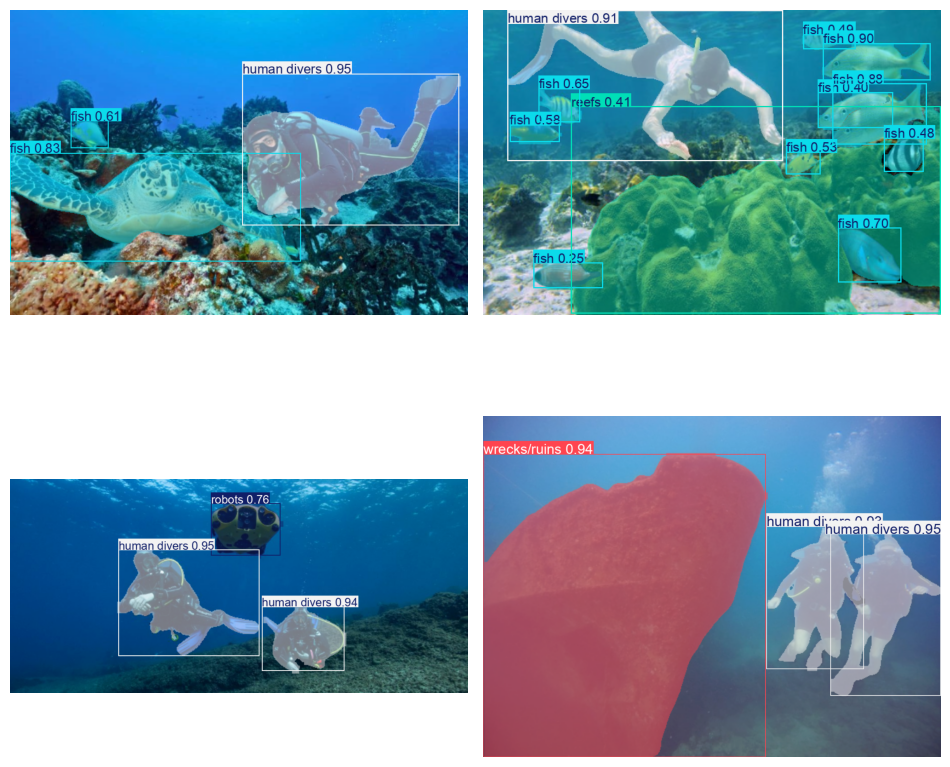

In [ ]:
instance_segmentation(
    list_urls[:4], random=False, font_size=None, save=True,
    path_save="InstanceSegmentation_YOLO11l_USIS10K_3.png"
)

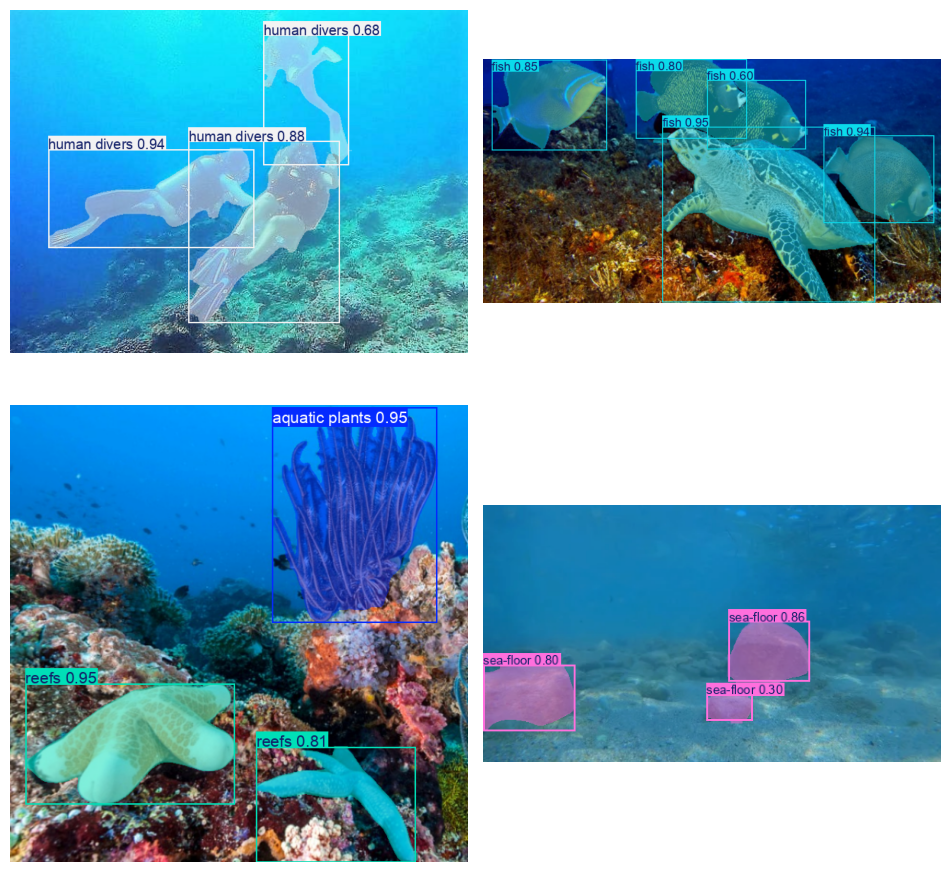

In [ ]:
instance_segmentation(list_urls[4:], random=False, font_size=None)

### **Video Inference**

The videos used for inference are downloaded from the [TikTok](https://www.tiktok.com/) website.

In [38]:
video_urls = [
    "/content/drive/MyDrive/Videos/USIS10K.mp4",
]

In [41]:
# Function for video inference
def video_segmentation(video, video_path):

  # Extract video properties (width and height) for display
  cap = cv2.VideoCapture(video)
  height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
  width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
  cap.release()
  max_dim = max(height, width)

  # Perform predictions
  results = model.predict(
      source=video,
      imgsz=max_dim,
      line_width=2,
      stream=False,
      stream_buffer=False,
      vid_stride=1,
      save=True,
      save_frames=False,
      verbose=False
  )

  # Convert the resulting video from AVI to MP4 format
  filename = os.path.basename(video).split(".")[0]
  result_path = os.path.join("/content/runs/segment/predict", f"{filename}.avi")
  !ffmpeg -i $result_path $video_path -loglevel quiet -y

  # Clean up temporary files generated during inference
  !rm -r /content/runs/
  clear_output(wait=False)

  # Display the processed video
  if max_dim > 960:
    height *= 960 / max_dim
    width *= 960 / max_dim

  display(Video(video_path, embed=True, width=width, height=height))

In [42]:
video_segmentation(video_urls[0], "InstanceSegmentation_YOLO11l_USIS10K.mp4")

## **Conclusion**

The **YOLO11l-seg** model, fine-tuned with the **USIS10K dataset**, achieved a $\text{mAP}^{\text{mask}}_{50}$ of **0.634** and a $\text{mAP}^{\text{mask}}_{50-95}$ of **0.49** on the validation set, and a $\text{mAP}^{\text{mask}}_{50}$ of **0.635** and a $\text{mAP}^{\text{mask}}_{50-95}$ of **0.495** on the test set. These results indicate a moderately high performance in underwater image segmentation, significantly outperforming the **USIS-SAM Multi-Class** model, which only achieved a $\text{mAP}^{\text{mask}}_{50}$ of **59.6** and a $\text{mAP}^{\text{mask}}_{50-95}$ of **43.9** on the test set, according to the [official GitHub](https://github.com/liamlian0727/usis10k#model-zoo) of the USIS10K dataset.

The worst performance was observed in the `aquatic plants` class, with a $\text{mAP}^{\text{mask}}_{50-95}$ barely above **0.15**, likely because this class is difficult to segment against the underwater background and is one of the classes with fewer instances, according to the USIS10K preprocessing. Conversely, the "fish" class achieved the best performance, with a $\text{mAP}^{\text{mask}}_{50}$ above **0.9**.

To achieve better results, it would be necessary to add more images containing instances of the minority classes, so that the fine-tuned model can generalize better. Furthermore, as observed during preprocessing, it would also be advisable to annotate small or partially occluded instances to make the model more robust. Although it is recommended to use the **YOLO11x-seg** model, the **YOLO11l-seg** model is sufficient to achieve excellent results, significantly outperforming the **USIS-SAM** model in multi-class instance segmentation.